Loading Tox21 dataset...
Dataset loaded with 7823 molecules


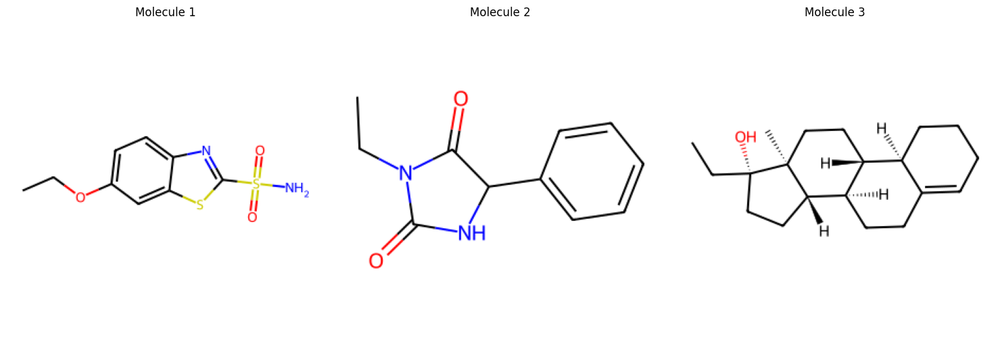

In [51]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.datasets import MoleculeNet
import matplotlib.pyplot as plt
import numpy as np
from rdkit import Chem
from rdkit.Chem import Draw
import pandas as pd
from tqdm.notebook import tqdm

# 1. Simplified Data Loading
print("Loading Tox21 dataset...")
dataset = MoleculeNet(root='./data', name='Tox21')
print(f"Dataset loaded with {len(dataset)} molecules")

# Display first few molecules
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i in range(3):
    mol = Chem.MolFromSmiles(dataset[i].smiles)
    img = Draw.MolToImage(mol)
    axes[i].imshow(img)
    axes[i].set_title(f"Molecule {i+1}")
    axes[i].axis('off')
plt.tight_layout()
plt.show()

In [52]:
class SimpleGCN(nn.Module):
    def __init__(self, input_dim=118, hidden_dim=64, num_tasks=12):
        super(SimpleGCN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, num_tasks)  # 12 tasks for Tox21
        
    def forward(self, x, adj):
        batch_size, num_nodes, num_features = x.shape
        
        # First GCN layer
        x = self.fc1(x)  # Shape: (batch_size, num_nodes, hidden_dim)
        x = F.relu(torch.bmm(adj, x))  # Batch matrix multiplication
        
        # Second GCN layer
        x = self.fc2(x)
        x = F.relu(torch.bmm(adj, x))
        
        # Global pooling and output
        x = x.mean(dim=1)  # Global pooling over nodes
        x = self.fc3(x)  # Final layer
        return torch.sigmoid(x)  # Shape: [batch_size, num_tasks]

In [53]:
def prepare_demo_batch(dataset, indices=[0, 1, 2]):
    batch_data = []
    
    for idx in indices:
        data = dataset[idx]
        mol = Chem.MolFromSmiles(data.smiles)
        
        if mol is None:
            continue
            
        # Create simplified adjacency matrix
        num_atoms = mol.GetNumAtoms()
        adjacency = torch.zeros((num_atoms, num_atoms))
        
        for bond in mol.GetBonds():
            i, j = bond.GetBeginAtomIdx(), bond.GetEndAtomIdx()
            adjacency[i, j] = 1
            adjacency[j, i] = 1
            
        # Create node features (simple one-hot encoding)
        node_features = torch.zeros((num_atoms, 118))
        for atom_idx, atom in enumerate(mol.GetAtoms()):
            atomic_num = atom.GetAtomicNum()
            if 0 < atomic_num <= 118:
                node_features[atom_idx, atomic_num-1] = 1.0
        
        # Handle multi-element labels with careful validation
        if data.y is not None and not torch.isnan(data.y).all():
            # Get label and ensure it's proper format
            if data.y.dim() > 0 and data.y.size(0) > 0:
                label = data.y.clone()  # Clone to avoid modifying original
                # Check for any issues and print if found
                if torch.isnan(label).any() or (label > 1).any() or (label < 0).any():
                    print(f"Found problematic label in index {idx}: {label}")
            else:
                label = torch.zeros(12)  # Default for missing labels
        else:
            label = torch.zeros(12)  # Default label if none exists
                
        batch_data.append({
            'adjacency': adjacency,
            'node_features': node_features,
            'label': label.float(),  # Ensure float type
            'smiles': data.smiles,
            'num_atoms': num_atoms
        })
    
    if not batch_data:
        print("Warning: Empty batch!")
        return None, None, None, None
        
    # Find maximum number of atoms for padding
    max_atoms = max(data['num_atoms'] for data in batch_data)
    
    # Initialize batch tensors
    batch_size = len(batch_data)
    batch_adj = torch.zeros(batch_size, max_atoms, max_atoms)
    batch_features = torch.zeros(batch_size, max_atoms, 118)
    batch_labels = torch.zeros(batch_size, 12)  # Fixed size for Tox21
    
    # Fill batch tensors with careful validation
    for b, data in enumerate(batch_data):
        n = data['num_atoms']
        batch_adj[b, :n, :n] = data['adjacency']
        batch_features[b, :n, :] = data['node_features']
        
        # Clean the labels: replace NaN with 0 and clamp values
        labels = data['label']
        labels = torch.where(torch.isnan(labels), torch.zeros_like(labels), labels)
        batch_labels[b] = torch.clamp(labels, 0.0, 1.0)
    
    return batch_adj, batch_features, batch_labels, [data['smiles'] for data in batch_data]

In [54]:
# 4. Demonstration
demo_adj, demo_features, demo_labels, demo_smiles = prepare_demo_batch(dataset)

print("Batch shapes:")
print(f"Adjacency matrix: {demo_adj.shape}")
print(f"Node features: {demo_features.shape}")
print(f"Labels: {demo_labels.shape}")

# Initialize model
model = SimpleGCN()

# Define loss function and optimizer
# Define this custom loss class
class MaskedBCELoss(nn.Module):
    def __init__(self):
        super(MaskedBCELoss, self).__init__()
        
    def forward(self, pred, target):
        # Create a mask for valid entries (not NaN)
        mask = ~torch.isnan(target)
        
        # Replace NaN with 0 (arbitrary value, won't be used)
        target_clean = torch.where(mask, target, torch.zeros_like(target))
        
        # Ensure values are between 0 and 1
        target_clean = torch.clamp(target_clean, 0.0, 1.0)
        
        # Calculate BCE only on valid entries
        bce = F.binary_cross_entropy(pred, target_clean, reduction='none')
        
        # Apply mask and calculate mean
        masked_bce = (bce * mask.float()).sum() / (mask.float().sum() + 1e-6)
        
        return masked_bce

# Then replace your criterion definition with:
criterion = MaskedBCELoss()  # Use custom loss instead of standard BCE
  # Binary Cross-Entropy Loss for classification
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)  # Adam optimizer

num_epochs = 20  # Adjust based on performance
batch_size = 32  # Adjust depending on dataset size

print("Checking label values...")
min_label = float('inf')
max_label = float('-inf')

for i in range(min(100, len(dataset))):  # Check first 100 samples
    data = dataset[i]
    if data.y is not None:
        min_val = data.y.min().item() if data.y.numel() > 0 else 0
        max_val = data.y.max().item() if data.y.numel() > 0 else 0
        min_label = min(min_label, min_val)
        max_label = max(max_label, max_val)

print(f"Min label value: {min_label}, Max label value: {max_label}")
# End of checking code

for epoch in range(num_epochs):
    model.train()  # Set model to training mode
    total_loss = 0.0
    
    # Shuffle and split dataset into mini-batches
    indices = torch.randperm(len(dataset))
    
    for i in range(0, len(dataset), batch_size):
        batch_indices = indices[i:i+batch_size].tolist()
        batch_adj, batch_features, batch_labels, _ = prepare_demo_batch(dataset, batch_indices)
        
        # Skip if batch preparation failed
        if batch_adj is None:
            continue
        
        optimizer.zero_grad()  # Reset gradients
        
        predictions = model(batch_features, batch_adj)  # Forward pass
        loss = criterion(predictions, batch_labels)  # Compute loss
        loss.backward()  # Backpropagation
        optimizer.step()  # Update weights
        
        total_loss += loss.item()
    
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss:.4f}")


# Forward pass
from sklearn.metrics import accuracy_score

model.eval()  # Set model to evaluation mode
with torch.no_grad():
    batch_adj, batch_features, batch_labels, _ = prepare_demo_batch(dataset, list(range(100)))
    predictions = model(batch_features, batch_adj)
    
    # For multi-label classification, calculate accuracy per task
    pred_binary = (predictions > 0.5).float()  # Threshold at 0.5
    correct = (pred_binary == batch_labels).float().sum()
    total = batch_labels.numel()
    accuracy = correct / total
    
    print(f"Test Accuracy: {accuracy:.4f}")


#Display Results
results = pd.DataFrame({
    'SMILES': demo_smiles
})

# Convert multi-label tensors to lists
results['True Label'] = demo_labels.tolist()
results['Predicted'] = predictions.tolist()

# Round predictions for better readability
# Ensure all predictions are lists before applying rounding
results['Predicted'] = results['Predicted'].apply(lambda x: [round(p, 3) for p in (x if isinstance(x, list) else [x])])



print("\nPrediction results (untrained model):")
display(results)


Found problematic label in index 0: tensor([[0., 0., 1., nan, nan, 0., 0., 1., 0., 0., 0., 0.]])
Found problematic label in index 1: tensor([[0., 0., 0., 0., 0., 0., 0., nan, 0., nan, 0., 0.]])
Found problematic label in index 2: tensor([[nan, nan, nan, nan, nan, nan, nan, 0., nan, 0., nan, nan]])
Batch shapes:
Adjacency matrix: torch.Size([3, 21, 21])
Node features: torch.Size([3, 21, 118])
Labels: torch.Size([3, 12])
Checking label values...
Min label value: 0.0, Max label value: 1.0
Found problematic label in index 1777: tensor([[1., 1., nan, nan, 0., 0., 0., 0., 0., 0., 0., 0.]])
Found problematic label in index 93: tensor([[0., nan, 0., nan, nan, 0., nan, 1., 0., 0., 0., 0.]])
Found problematic label in index 6188: tensor([[0., 0., 0., 0., 0., 0., 0., nan, 0., nan, 0., 0.]])
Found problematic label in index 3641: tensor([[0., 0., nan, 0., 0., 0., 0., 0., 0., 0., 0., 0.]])
Found problematic label in index 1361: tensor([[0., 0., nan, nan, 1., 0., 0., 0., 0., 0., 0., 0.]])
Found prob

ValueError: Length of values (100) does not match length of index (3)

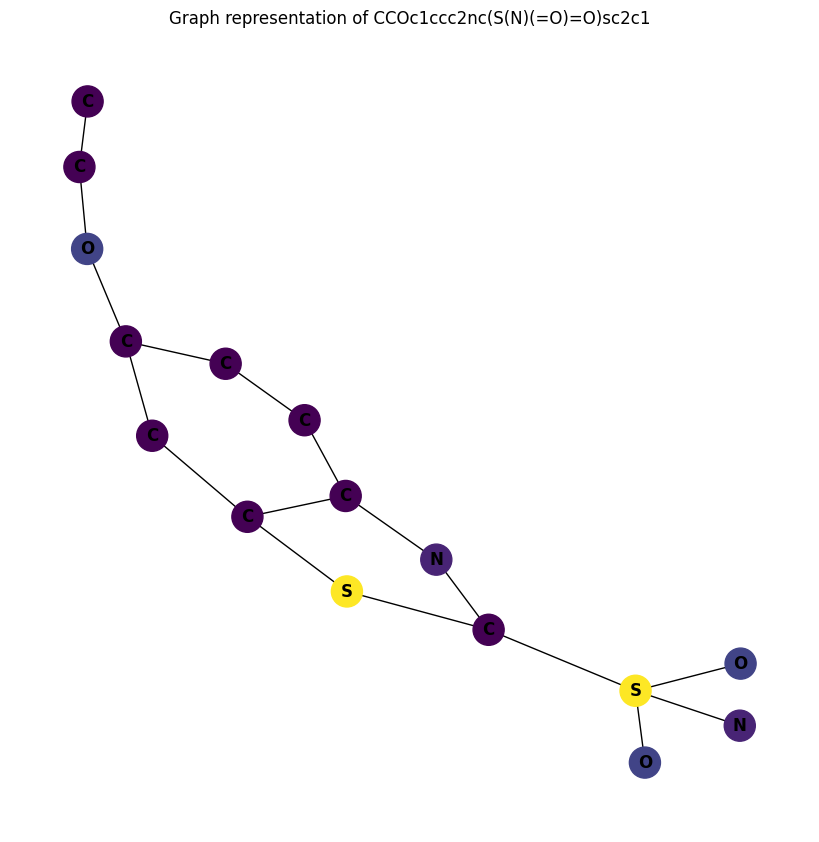

In [37]:
# 5. Visualize one molecule as graph
from networkx import Graph
import networkx as nx

def mol_to_networkx(mol):
    G = Graph()
    
    for atom in mol.GetAtoms():
        G.add_node(atom.GetIdx(), 
                   symbol=atom.GetSymbol(),
                   atomic_num=atom.GetAtomicNum())
        
    for bond in mol.GetBonds():
        G.add_edge(bond.GetBeginAtomIdx(),
                   bond.GetEndAtomIdx(),
                   bond_type=bond.GetBondType())
        
    return G

# Visualize first molecule as graph
mol = Chem.MolFromSmiles(demo_smiles[0])
G = mol_to_networkx(mol)

plt.figure(figsize=(8, 8))
pos = nx.spring_layout(G, seed=42)

node_labels = {i: data['symbol'] for i, data in G.nodes(data=True)}
node_colors = [data['atomic_num'] for _, data in G.nodes(data=True)]

nx.draw(G, pos, labels=node_labels, node_color=node_colors, 
        node_size=500, cmap=plt.cm.viridis, 
        with_labels=True, font_weight='bold')

plt.title(f"Graph representation of {demo_smiles[0]}")
plt.show()